# Image Enhancement

In [ ]:
img = cv2.imread("img.jpeg", 1)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Adjust brightness

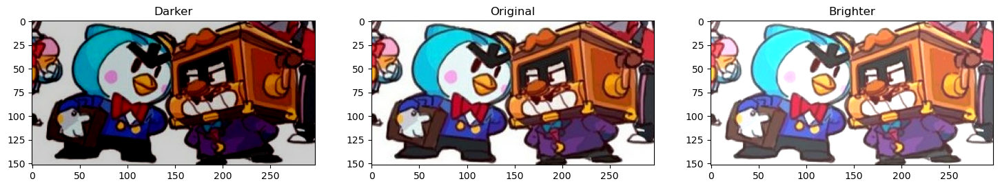

In [344]:
matrix = np.ones(img_rgb.shape, dtype='uint8')*50

img_rgb_brighter = cv2.add(img_rgb, matrix)
img_rgb_darker = cv2.subtract(img_rgb, matrix)

plt.figure(figsize=[18, 5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Darker");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Brighter");

# Adjust contrast

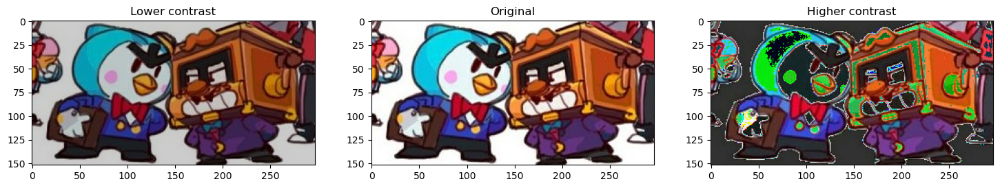

In [349]:
matrix1 = np.ones(img_rgb.shape, dtype='uint8') * .8
matrix2 = np.ones(img_rgb.shape, dtype='uint8') * 1.2

img_rgb_darker = np.uint8(cv2.multiply(np.float64(img_rgb), matrix1))
img_rgb_brighter = np.uint8(cv2.multiply(np.float64(img_rgb), matrix2))

plt.figure(figsize=[18, 5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Lower contrast");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Higher contrast");

* The reason why higher contrast his disorted is because, when we multiply, we get values greater than 256
* Those white portions of the image were already 255, multiplying them made them bigger and when we convert to unsigned int - 8 bits is not enough to store that data, and leading parts roll over, which cause only partial info fitting in the bits, which is the reason for the distortion
* To handle overflow, we have to clip those values

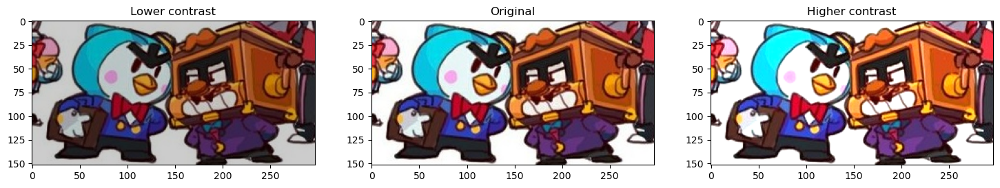

In [355]:
img_rgb_brighter = np.uint8(np.clip(cv2.multiply(np.float64(img_rgb), matrix2), 0, 255))
plt.figure(figsize=[18, 5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Lower contrast");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Higher contrast");

# Image thresholding

* Lets us to create binary images which allows us to selectively modify portions of image while leaving other portions intact

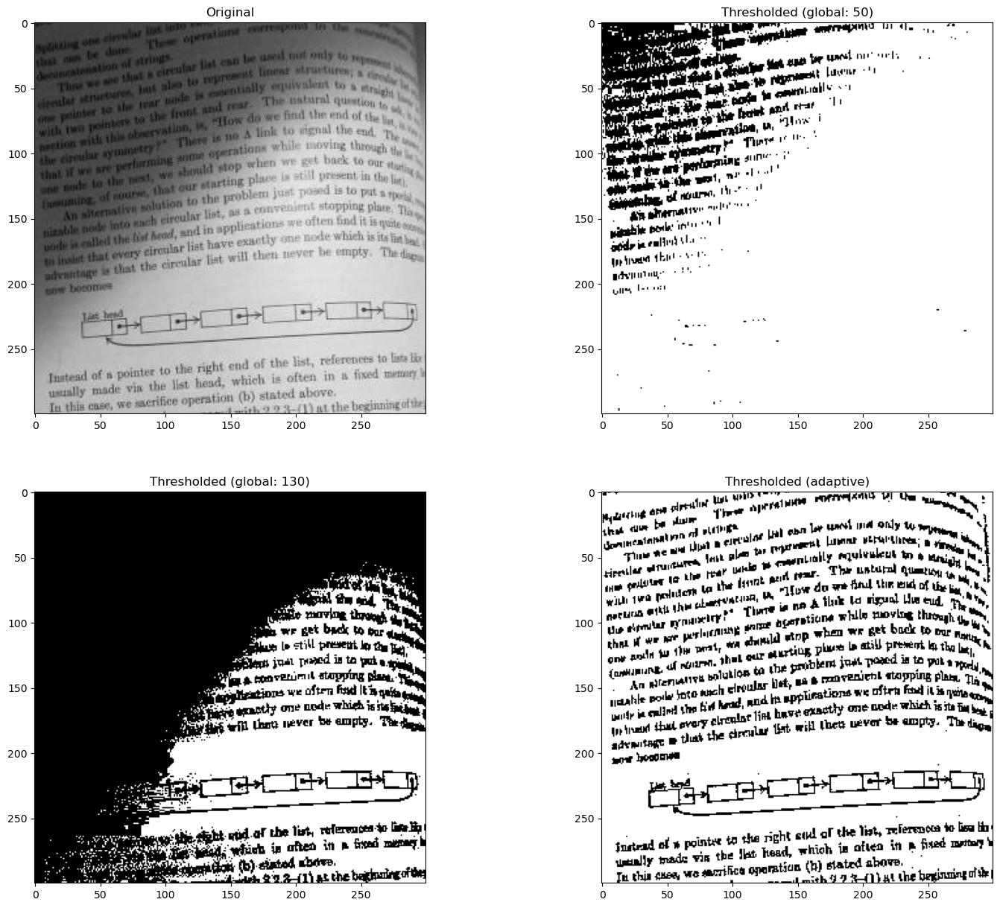

In [365]:
img_read = cv2.imread("page.jpg", cv2.IMREAD_GRAYSCALE)

retval, img_thresh_gbl_1 = cv2.threshold(img_read, 50, 255, cv2.THRESH_BINARY)
retval, img_thresh_gbl_2 = cv2.threshold(img_read, 130, 255, cv2.THRESH_BINARY)
img_thresh_adp = cv2.adaptiveThreshold(img_read, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 7)


plt.figure(figsize=[18,15])
plt.subplot(221); plt.imshow(img_read,        cmap="gray");  plt.title("Original");
plt.subplot(222); plt.imshow(img_thresh_gbl_1,cmap="gray");  plt.title("Thresholded (global: 50)");
plt.subplot(223); plt.imshow(img_thresh_gbl_2,cmap="gray");  plt.title("Thresholded (global: 130)");
plt.subplot(224); plt.imshow(img_thresh_adp,  cmap="gray");  plt.title("Thresholded (adaptive)");

# Bitwise operations

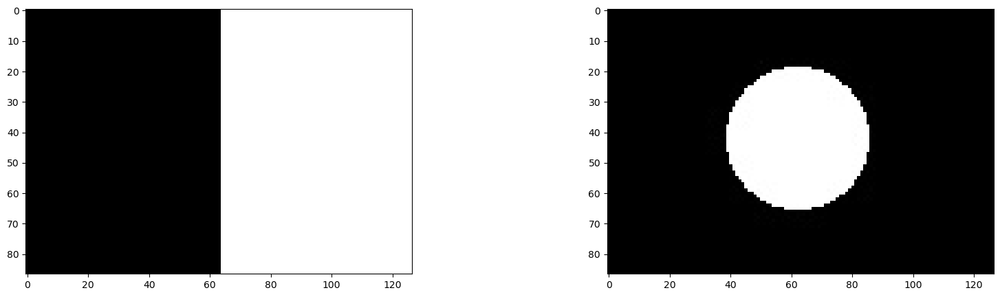

In [370]:
img_rec = cv2.imread("rect.jpg", cv2.IMREAD_GRAYSCALE)

img_cir = cv2.imread("circle.jpg", cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=[20, 5])
plt.subplot(121);plt.imshow(img_rec, cmap="gray")
plt.subplot(122);plt.imshow(img_cir, cmap="gray")

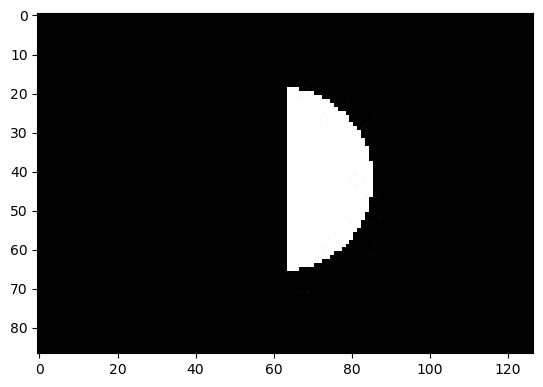

In [374]:
plt.imshow(cv2.bitwise_and(img_rec, img_cir, mask=None), cmap="gray")

* if both pixels are white, it returns white, else black 

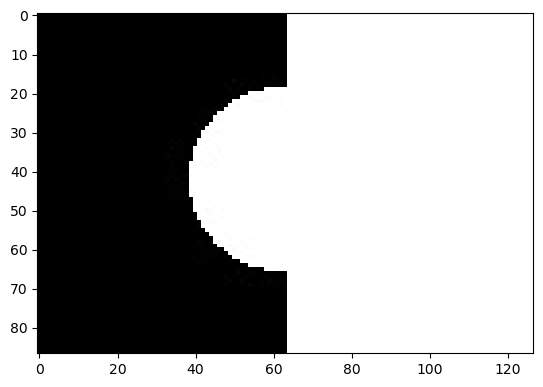

In [377]:
plt.imshow(cv2.bitwise_or(img_rec, img_cir, mask=None), cmap="gray")

* if both pixels are black, it returns black, else white

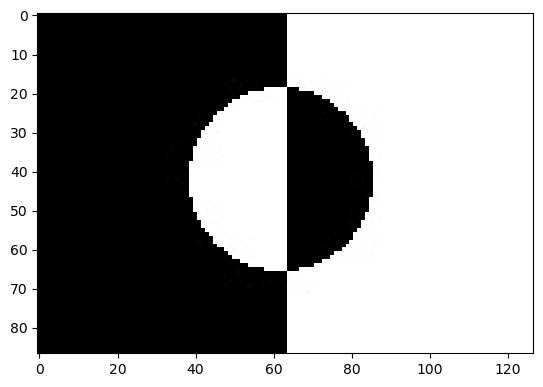

In [381]:
plt.imshow(cv2.bitwise_xor(img_rec, img_cir, mask=None), cmap="gray")

* if both pixels are different, it returns white, else black

In [9]:
img_bgr = cv2.imread("img.jpeg")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
print(img_rgb.shape)

(152, 297, 3)


(152, 297, 3)


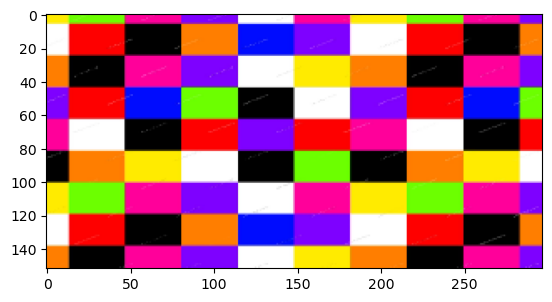

In [398]:
background_bgr = cv2.imread("colors.jpg")
background_rgb = cv2.cvtColor(background_bgr, cv2.COLOR_BGR2RGB)
background_rgb = cv2.resize(background_rgb, (297, 152))
print(background_rgb.shape)
plt.imshow(background_rgb);

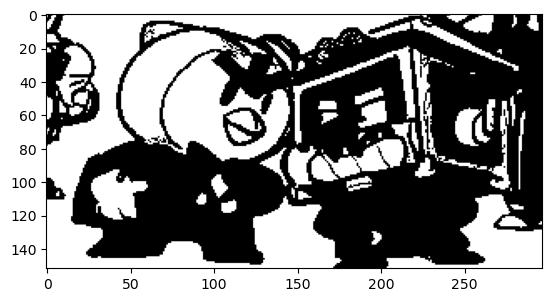

In [402]:
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
retval, img_mask = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
plt.imshow(img_mask, cmap="gray");

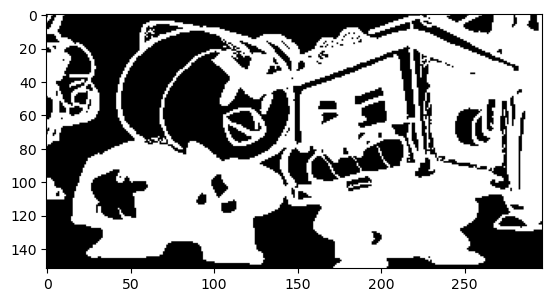

In [406]:
img_mask_inv = cv2.bitwise_not(img_mask)
plt.imshow(img_mask_inv, cmap="gray");

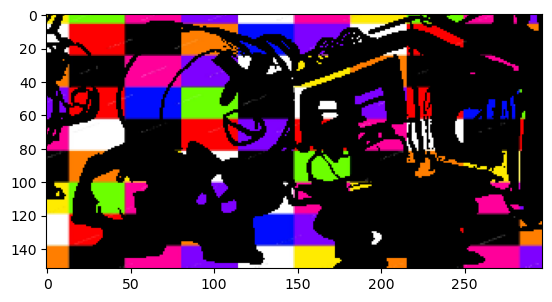

In [408]:
img_background = cv2.bitwise_and(background_rgb, background_rgb, mask=img_mask)
plt.imshow(img_background);

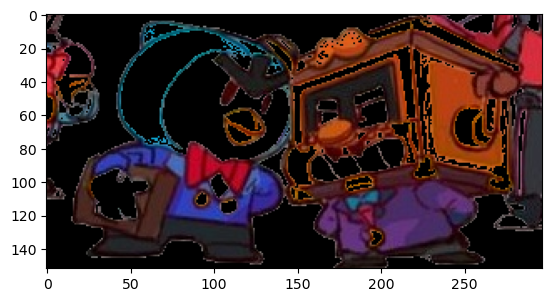

In [410]:
img_foreground = cv2.bitwise_and(img_rgb, img_rgb, mask=img_mask_inv)
plt.imshow(img_foreground);

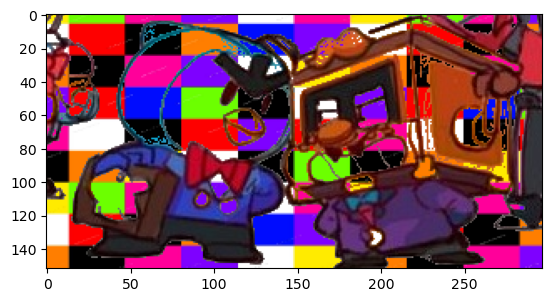

In [412]:
result = cv2.add(img_background, img_foreground)
plt.imshow(result)

# Panorama

In [417]:
import cv2
import glob
import os
import matplotlib.pyplot as plt
import math

imagefiles = glob.glob(f"boat{os.sep}*")
imagefiles.sort()


images = []
for filename in imagefiles:
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)

num_images = len(images)

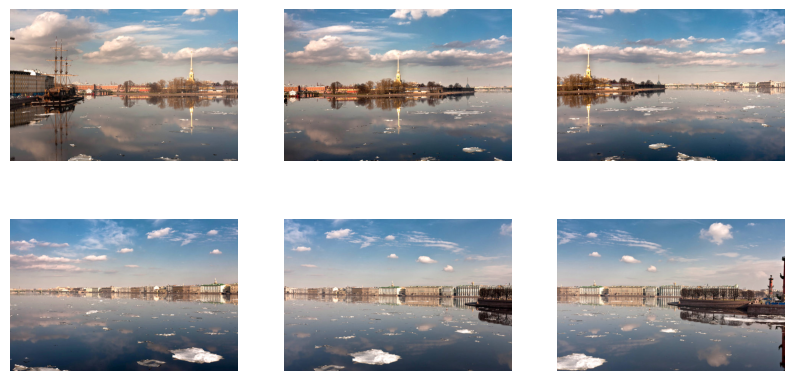

In [433]:
plt.figure(figsize=[10, 5])
num_cols = 3
num_rows = math.ceil(num_images / num_cols)
for i in range(0, num_images):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.axis("off")
    plt.imshow(images[i])

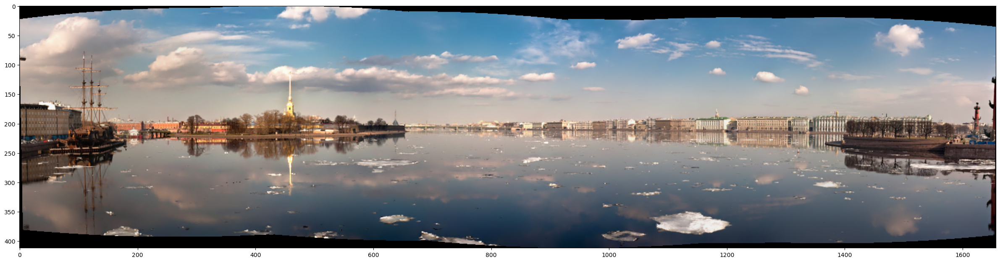

In [435]:
stitcher = cv2.Stitcher_create()
status, result = stitcher.stitch(images)

if status == 0:
    plt.figure(figsize=[30, 10])
    plt.imshow(result)

# High Dynamic Range Imaging (HDR`)

Assume a picture of a boy standing in green fields. In a regular photo one of the below two is seen:
* The foreground is clear, while the background is too bright/white
* The background is clear, while the foreground is too dark/dim

The reason that occurs is, the actual intensities in a real world scene far exceeds the capability of the cameras which record those values.<br>
Most of the cameras only have 8bit capacity for a channel, they dont have the capability to capture the full dynamic range of the scene

HDR mode solves this problem, but how?<br>
* It takes 3 (low dynamic range) photos of different exposures at once (almost instantly)
* And merges them to come up with the HDR

In [439]:
filenames = ["img_0.033.jpg", "img_0.25.jpg", "img_2.5.jpg", "img_15.jpg"]
times = np.array([1 / 30.0, 0.25, 2.5, 15.0], dtype=np.float32)

images = []
for filename in filenames:
    im = cv2.imread(filename)
    images.append(im)

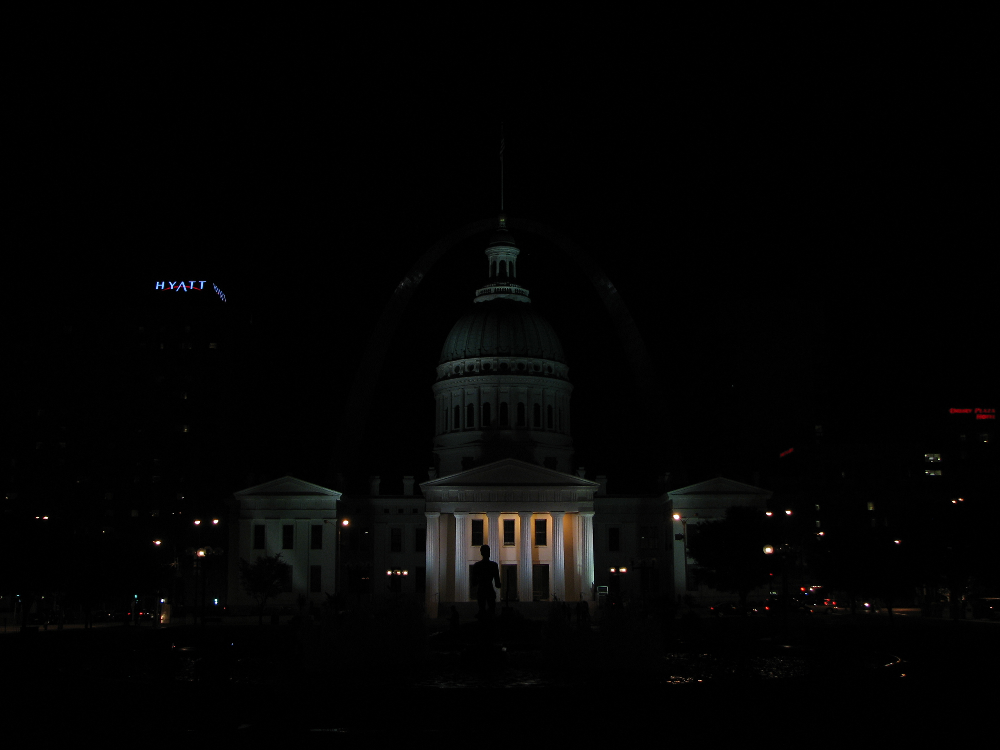

In [448]:
Image(filename= filenames[0])

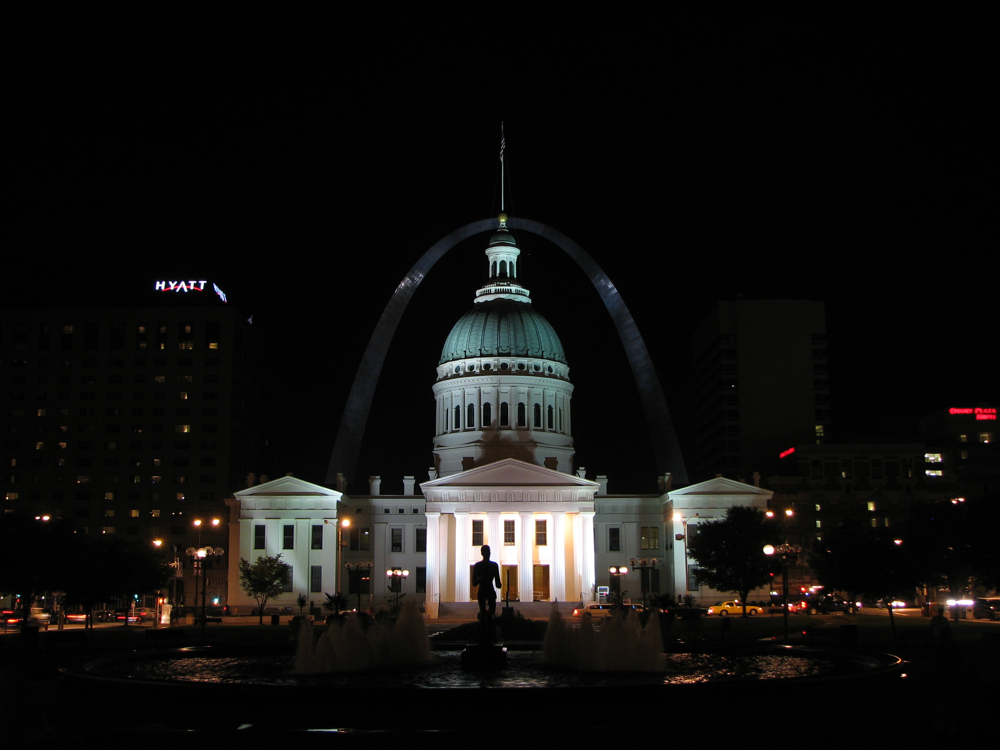

In [450]:
Image(filename= filenames[1])

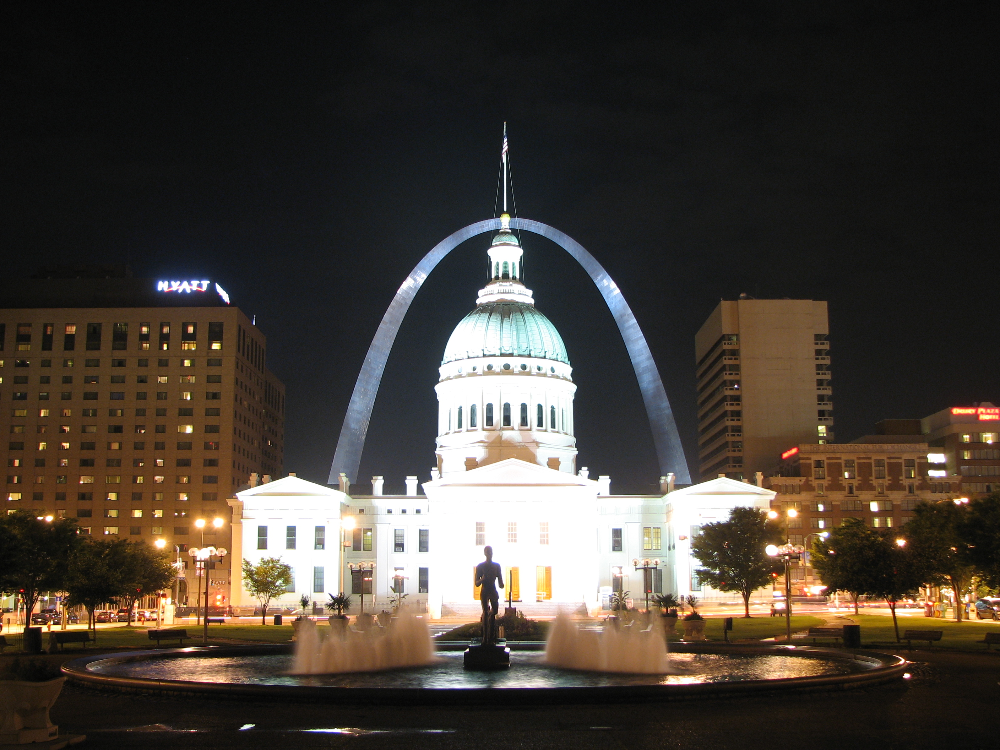

In [452]:
Image(filename= filenames[2])

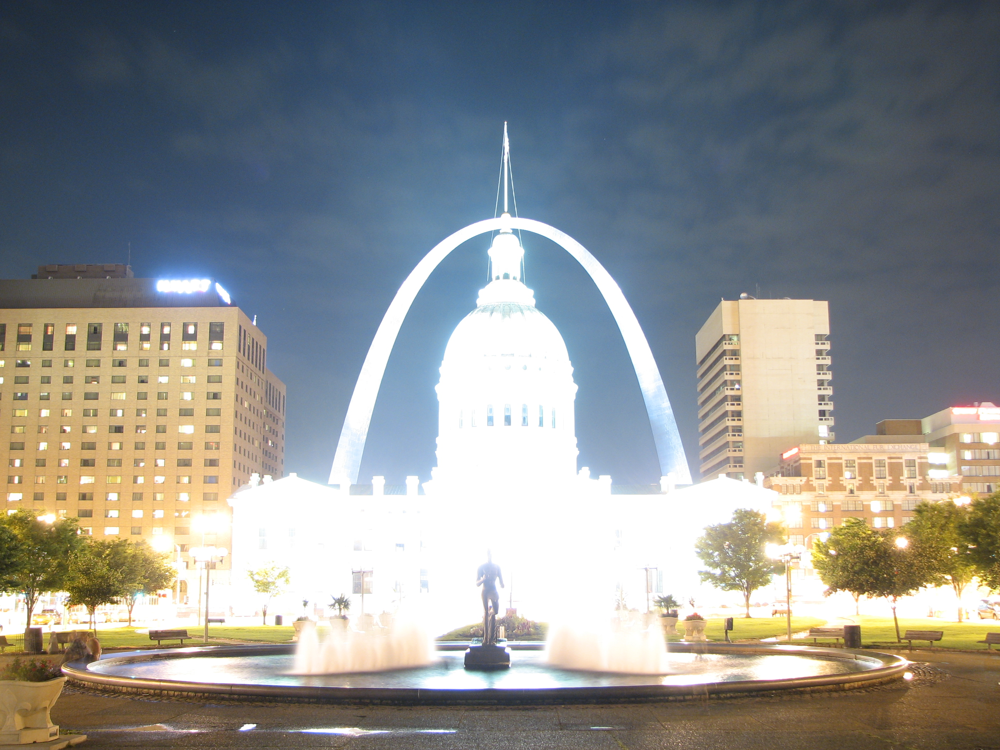

In [454]:
Image(filename= filenames[3])

We have to align the images down to the pixel level

In [442]:
alignMTB = cv2.createAlignMTB()
alignMTB.process(images, images)

Estimate camera response function<br>
The reason we do this is, most cameras we use are not linear, which means if the radiance of a scene gets doubled, the pixel intensity doesnt exactly get doubled

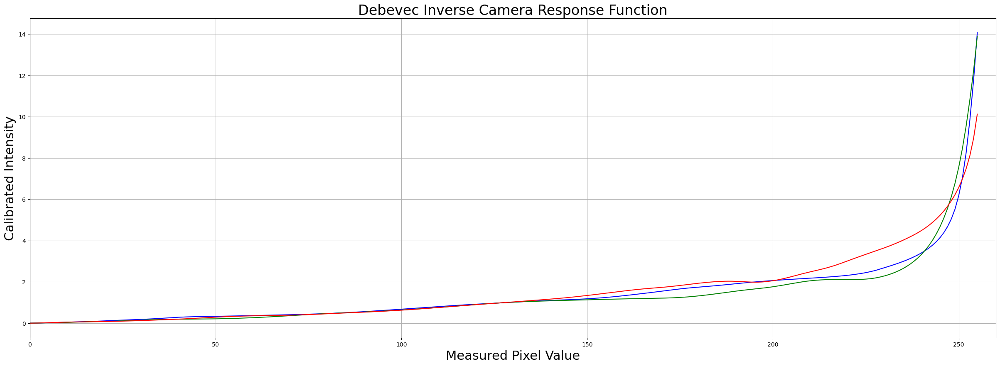

In [446]:
calibrateDebevec = cv2.createCalibrateDebevec()
responseDebevec = calibrateDebevec.process(images, times)

x = np.arange(256, dtype=np.uint8)
y = np.squeeze(responseDebevec)

ax = plt.figure(figsize=(30, 10))
plt.title("Debevec Inverse Camera Response Function", fontsize=24)
plt.xlabel("Measured Pixel Value", fontsize=22)
plt.ylabel("Calibrated Intensity", fontsize=22)
plt.xlim([0, 260])
plt.grid()
plt.plot(x, y[:, 0], "b", x, y[:, 1], "g", x, y[:, 2], "r")

Merge Exposure into an HDR image

In [457]:
mergeDebevec = cv2.createMergeDebevec()
hdrDebevac = mergeDebevec.process(images, times, responseDebevec)

Tonemapping
* converts HDR to 8bit per channel
* Since we are combining images from different exposure, the pixel values range for the same color vary across the images, we have to bring them all to the same range

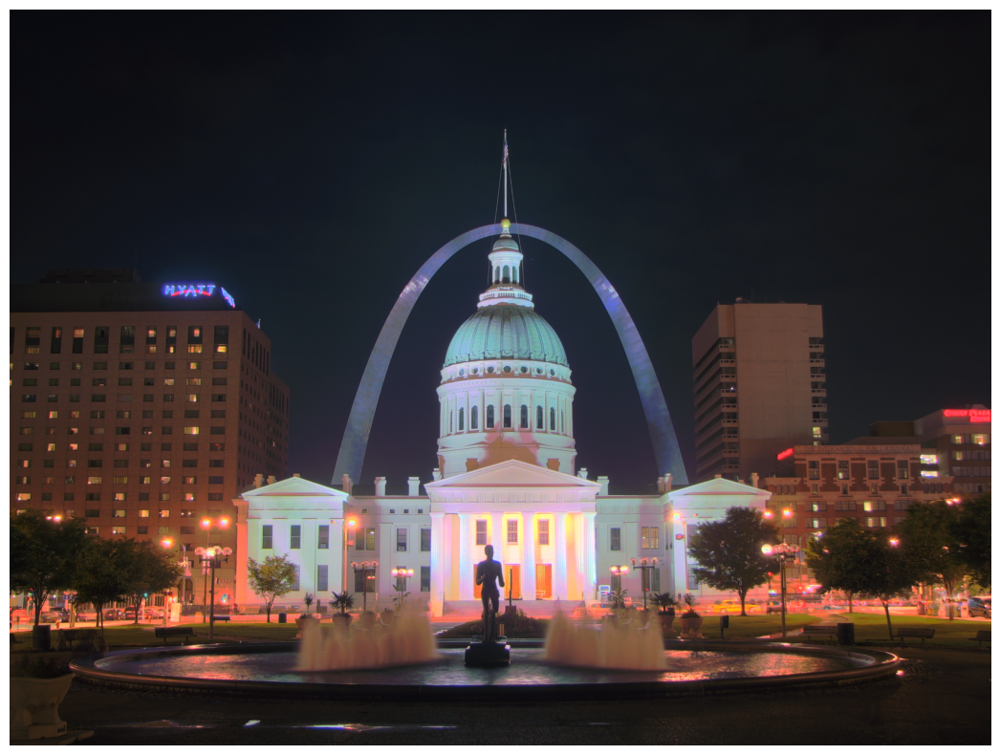

In [463]:
tonemapDrago = cv2.createTonemapDrago(1.0, 0.7)
ldrDrago = tonemapDrago.process(hdrDebevac)
ldrDrago = 3*ldrDrago
plt.figure(figsize=(20, 10));plt.imshow(np.clip(ldrDrago, 0, 1)[:,:,::-1]);plt.axis("off");